In [1]:
import torch
import timm
from pprint import pprint
import matplotlib.pyplot as plt
import numpy as np

model_names = timm.list_models('*vit*t*')
pprint(model_names)

/Users/zyxu/opt/anaconda3/envs/py39/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


['convit_tiny',
 'crossvit_tiny_240',
 'gcvit_tiny',
 'gcvit_xtiny',
 'gcvit_xxtiny',
 'maxvit_rmlp_tiny_rw_256',
 'maxvit_tiny_224',
 'maxvit_tiny_pm_256',
 'maxvit_tiny_rw_224',
 'maxvit_tiny_rw_256',
 'maxxvit_rmlp_tiny_rw_256',
 'mobilevitv2_150_384_in22ft1k',
 'mobilevitv2_150_in22ft1k',
 'mobilevitv2_175_384_in22ft1k',
 'mobilevitv2_175_in22ft1k',
 'mobilevitv2_200_384_in22ft1k',
 'mobilevitv2_200_in22ft1k',
 'mvitv2_tiny',
 'vit_base_patch8_224',
 'vit_base_patch8_224_dino',
 'vit_base_patch8_224_in21k',
 'vit_base_patch16_18x2_224',
 'vit_base_patch16_224',
 'vit_base_patch16_224_dino',
 'vit_base_patch16_224_in21k',
 'vit_base_patch16_224_miil',
 'vit_base_patch16_224_miil_in21k',
 'vit_base_patch16_224_sam',
 'vit_base_patch16_384',
 'vit_base_patch16_plus_240',
 'vit_base_patch16_rpn_224',
 'vit_base_patch32_224',
 'vit_base_patch32_224_clip_laion2b',
 'vit_base_patch32_224_in21k',
 'vit_base_patch32_224_sam',
 'vit_base_patch32_384',
 'vit_base_patch32_plus_256',
 'vit_base

In [9]:
vit_base_patch16_224 = timm.create_model("vit_large_patch16_224", pretrained=True)

In [10]:
vit_base_patch16_224

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=1024, out_features=3072, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=1024, out_features=1024, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=1024, out_features=4096, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (fc2): Linear(in_features=4096, out_features=1024, bias=True)
        (drop2): Dropout(p=0.0, i

In [4]:
state_dict = vit_base_patch16_224.state_dict()
num_heads = 12

In [ ]:
def visualize_matrices_side_by_side(matrices, titles):
    fig, axes = plt.subplots(1, len(matrices), figsize=(60, 5))
    for ax, matrix, title in zip(axes, matrices, titles):
        ax.imshow(matrix, cmap='viridis')
        ax.set_title(title)
        ax.axis('off')
    plt.colorbar(axes[-1].imshow(matrices[-1], cmap='viridis'), ax=axes.ravel().tolist())
    plt.show()

In [16]:
W_qkv = state_dict["blocks.0.attn.qkv.weight"].t()  # Transpose to split correctly
# Splitting the combined matrix to get individual matrices for each head
W_q, W_k, W_v = torch.chunk(W_qkv, 3, dim=1)  # Split along the column dimension

# Since there are 3 heads, we further split each matrix along the row dimension
W_qs = torch.chunk(W_q, num_heads, dim=0)
W_ks = torch.chunk(W_k, num_heads, dim=0)
W_vs = torch.chunk(W_v, num_heads, dim=0)

W_proj = state_dict["blocks.0.attn.proj.weight"]
# Split W_proj along its column dimension
W_projs = torch.chunk(W_proj, num_heads, dim=0)


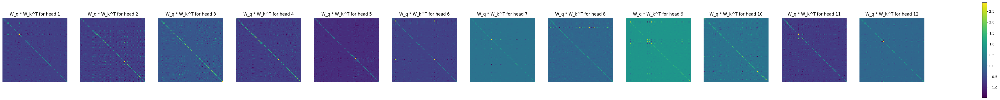

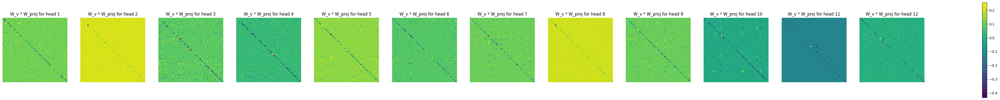

In [18]:


# Compute W_q * W_k^T for each head
matrix_q_k = [torch.mm(W_qs[i], W_ks[i].t()).detach().numpy() for i in range(num_heads)]

visualize_matrices_side_by_side(matrix_q_k, [f"W_q * W_k^T for head {i+1}" for i in range(num_heads)])

matrix_v_proj = [torch.mm(W_vs[i], W_projs[i].t()).detach().numpy() for i in range(num_heads)]
visualize_matrices_side_by_side(matrix_v_proj, [f"W_v * W_proj for head {i+1}" for i in range(num_heads)])


## arrange all

In [5]:
# Initialize containers for all blocks' weights
W_q_all, W_k_all, W_v_all, W_proj_all = [], [], [], []

for block_idx in range(12):
    prefix = f"blocks.{block_idx}.attn."

    W_qkv = state_dict[prefix + "qkv.weight"].t()  # Transpose for splitting
    W_q, W_k, W_v = torch.chunk(W_qkv, 3, dim=1)
    W_q_all.append(torch.chunk(W_q, num_heads, dim=0))
    W_k_all.append(torch.chunk(W_k, num_heads, dim=0))
    W_v_all.append(torch.chunk(W_v, num_heads, dim=0))
    W_proj_all.append(torch.chunk(state_dict[prefix + "proj.weight"], num_heads, dim=0))

matrix_q_k_all = [[torch.mm(W_q_all[block][head], W_k_all[block][head].t()).detach().numpy() 
                   for head in range(num_heads)] 
                  for block in range(12)]

matrix_v_proj_sum_all = [sum([torch.mm(W_v_all[block][head], W_proj_all[block][head].t()).detach().numpy() 
                              for head in range(num_heads)]) 
                         for block in range(12)]

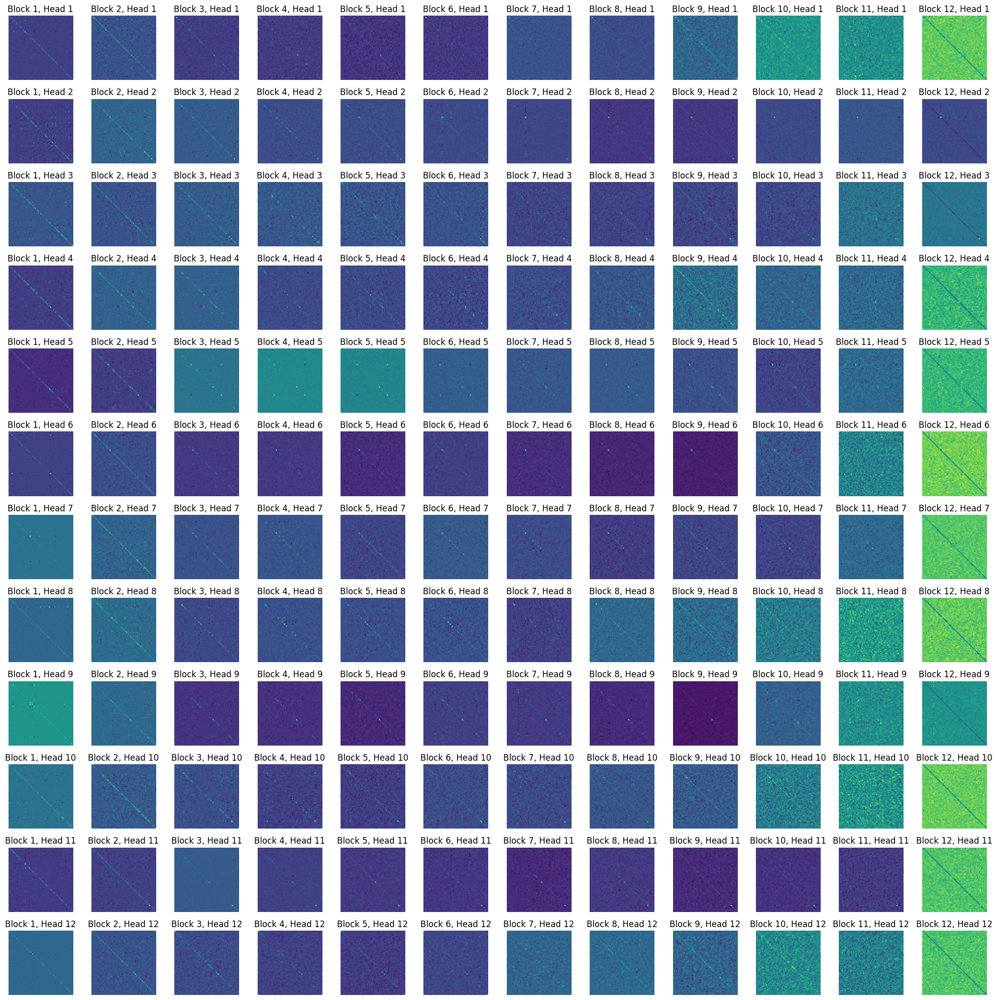

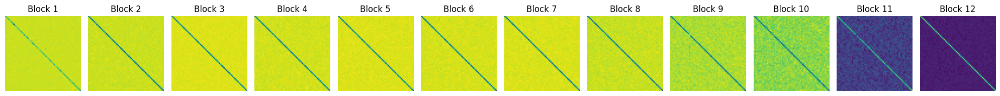

In [6]:
import matplotlib.pyplot as plt

# Visualization Function for W_q * W_k^T
def visualize_qk_as_pdf(matrix_q_k_all, filename):
    nblocks, nheads = len(matrix_q_k_all), len(matrix_q_k_all[0])
    fig, axes = plt.subplots(nheads, nblocks, figsize=(20, 5/3*num_heads))
    
    for block_idx in range(nblocks):
        for head_idx in range(nheads):
            ax = axes[head_idx][block_idx]
            ax.imshow(matrix_q_k_all[block_idx][head_idx], cmap='viridis')
            ax.set_title(f"Block {block_idx+1}, Head {head_idx+1}")
            ax.axis('off')
    plt.tight_layout()
    plt.savefig(filename, format="pdf", bbox_inches='tight')

visualize_qk_as_pdf(matrix_q_k_all, "vit_base_W_q_W_k_T.pdf")

# Visualization Function for Sum of W_v * W_proj
def visualize_v_proj_sum_as_pdf(matrix_v_proj_sum_all, filename):
    fig, axes = plt.subplots(1, len(matrix_v_proj_sum_all), figsize=(20, 2))
    
    for block_idx, matrix in enumerate(matrix_v_proj_sum_all):
        ax = axes[block_idx]
        ax.imshow(matrix, cmap='viridis')
        ax.set_title(f"Block {block_idx+1}")
        ax.axis('off')
    plt.tight_layout()
    plt.savefig(filename, format="pdf", bbox_inches='tight')

visualize_v_proj_sum_as_pdf(matrix_v_proj_sum_all, "vit_base_W_v_W_proj_sum.pdf")


### ViT base dino

In [24]:
vit_base_patch16_224_dino = timm.create_model("vit_base_patch16_224_dino", pretrained=True)

In [25]:
vit_base_patch16_224_dino

VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop2): Dropout(p=0.0, inplace=F

In [26]:
state_dict = vit_base_patch16_224_dino.state_dict()
num_heads = 12

### arrange all

In [27]:
# Initialize containers for all blocks' weights
W_q_all, W_k_all, W_v_all, W_proj_all = [], [], [], []

for block_idx in range(12):
    prefix = f"blocks.{block_idx}.attn."

    W_qkv = state_dict[prefix + "qkv.weight"].t()  # Transpose for splitting
    W_q, W_k, W_v = torch.chunk(W_qkv, 3, dim=1)
    W_q_all.append(torch.chunk(W_q, num_heads, dim=0))
    W_k_all.append(torch.chunk(W_k, num_heads, dim=0))
    W_v_all.append(torch.chunk(W_v, num_heads, dim=0))
    W_proj_all.append(torch.chunk(state_dict[prefix + "proj.weight"], num_heads, dim=0))

matrix_q_k_all = [[torch.mm(W_q_all[block][head], W_k_all[block][head].t()).detach().numpy() 
                   for head in range(num_heads)] 
                  for block in range(12)]

matrix_v_proj_sum_all = [sum([torch.mm(W_v_all[block][head], W_proj_all[block][head].t()).detach().numpy() 
                              for head in range(num_heads)]) 
                         for block in range(12)]

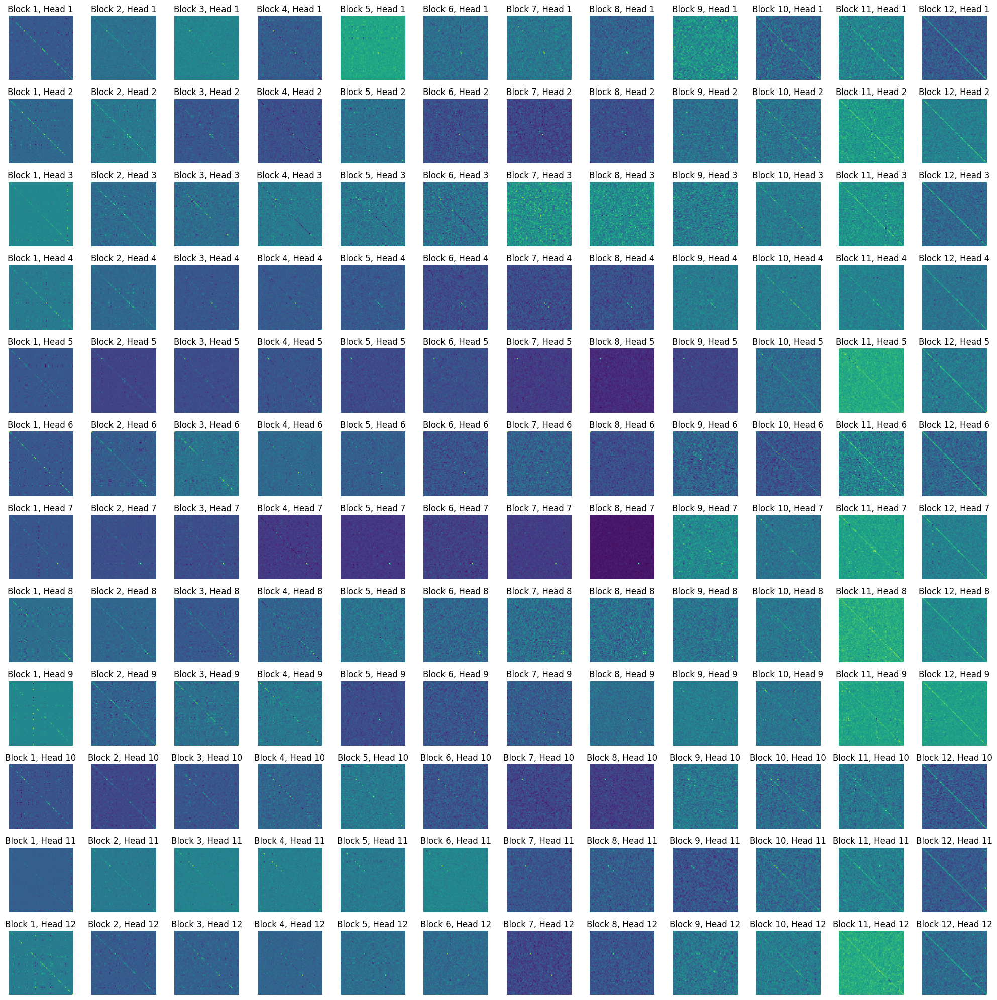

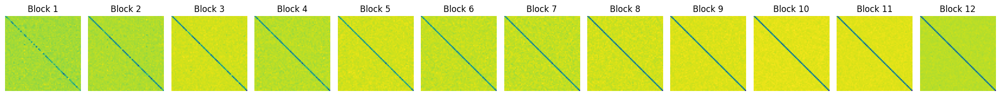

In [28]:
import matplotlib.pyplot as plt

# Visualization Function for W_q * W_k^T
def visualize_qk_as_pdf(matrix_q_k_all, filename):
    nblocks, nheads = len(matrix_q_k_all), len(matrix_q_k_all[0])
    fig, axes = plt.subplots(nheads, nblocks, figsize=(20, 5/3*num_heads))
    
    for block_idx in range(nblocks):
        for head_idx in range(nheads):
            ax = axes[head_idx][block_idx]
            ax.imshow(matrix_q_k_all[block_idx][head_idx], cmap='viridis')
            ax.set_title(f"Block {block_idx+1}, Head {head_idx+1}")
            ax.axis('off')
    plt.tight_layout()
    plt.savefig(filename, format="pdf", bbox_inches='tight')

visualize_qk_as_pdf(matrix_q_k_all, "vit_base_dino_W_q_W_k_T.pdf")

# Visualization Function for Sum of W_v * W_proj
def visualize_v_proj_sum_as_pdf(matrix_v_proj_sum_all, filename):
    fig, axes = plt.subplots(1, len(matrix_v_proj_sum_all), figsize=(20, 2))
    
    for block_idx, matrix in enumerate(matrix_v_proj_sum_all):
        ax = axes[block_idx]
        ax.imshow(matrix, cmap='viridis')
        ax.set_title(f"Block {block_idx+1}")
        ax.axis('off')
    plt.tight_layout()
    plt.savefig(filename, format="pdf", bbox_inches='tight')

visualize_v_proj_sum_as_pdf(matrix_v_proj_sum_all, "vit_base_dino_W_v_W_proj_sum.pdf")
